# Deskriptiv statitsik
Dette program laver deskriptiv statistik og plots af samlet analysedata

## Indlæsning af pakker
1. Indlæser pakker
2. Laver paths

In [100]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import geopandas as gpd
from pathlib import Path # To make relative paths
import plotly.express as px
pd.options.display.max_columns = None
import plotly.express as px
import plotly.io as pio

pio.renderers.default = 'browser'  # or 'browser', 'notebook_connected', etc., depending on your environment

px.set_mapbox_access_token('your_mapbox_access_token_here')

In [101]:
my_path = Path.cwd() # Path to current directory
project_path = my_path.parents[0] # Path to project directory
data_path = project_path / 'Data' # Path to data folder
data_path

WindowsPath('C:/Users/nld/Introduction to Data Science/Exam Project/Data')

## Indlæsning af data

In [102]:
# Samlet data
final_df = pd.read_parquet(data_path/'ML_Dataset.parquet', engine='pyarrow')
final_df = final_df[~final_df['latitude'].isna()]
final_df = final_df[~final_df['latitude'].isna()]

# Fjerner fejl i expenses og missings
final_df = final_df[(final_df['exp']<100000) & (final_df['exp']!=0)]

# Jobopslag
job_df = pd.read_csv(data_path/'jobs_cleaned.csv', sep = ";", encoding = 'utf-8')

# Boliger
bolig_df = pd.read_csv(data_path/'boliger_cleaned.csv', sep = ";", encoding = 'utf-8')

# Stationer
station_df = pd.read_csv(data_path/'station_data.csv', encoding = 'utf-8')

In [103]:
# Geografiske data
# Load Danish zip code GeoJSON or shapefile
geo_zip_df = gpd.read_file('postal_codes.geojson.txt')

# Load Danish zip code GeoJSON or shapefile
geo_mun_df = gpd.read_file('municipalities.geojson.txt')


In [104]:
print(len(final_df))
print(len(job_df))
print(len(bolig_df))

42709
14499
43337


### Cleaning af data

In [105]:
# Set 'rooms' to NaN where 'rooms' == 0 and 'propertyType' is not 7 or 8
# final_df.loc[(final_df['rooms'] == 0) & 
#                       (~final_df['propertyType'].isin([7, 8])), 'rooms'] = np.nan

# # # Sætter lotSize til missing, hvis den er 0 eller 1  og det ikke er en lejlighed
# # final_df.loc[
# #     (final_df['lotSize'].isin([0,1])) & 
# #     (final_df['propertyType'] != 3), 'lotSize'
# # ] = np.nan

# # Sætter kommune til missing hvis den er 0 eller 1
# final_df[final_df['rooms']==0]

In [106]:
# Udvælger variable
final_df_selected = final_df[['job_density', 'distance_to_nearest_station', 'nearest_station_name',
                    'departures_per_hour', 'distance_to_job_center', 'propertyType',
                    'energyClass', 'priceCash', 'rooms', 'size', 'lotSize', 'buildYear', 'zipCode', 'municipality',
                    'area', 'exp', 'basementSize', 'cleanStreet']]
final_df_selected
final_df

,geometry,job_density,distance_to_nearest_station,nearest_station_name,departures_per_hour,distance_to_job_center,latitude,longitude,propertyType,energyClass,priceCash,selfsale,rooms,size,lotSize,buildYear,city,zipCode,area,exp,basementSize,businessArea,nonPremiumDiscrete,cleanStreet,municipality
0,POINT (9.73815 55.05967),17.0,16.529831,Sønderborg,0.0,52.754986,55.05967,9.73815,1,-,395000,False,6.0,128,1027.0,1954.0,Nordborg,6430,8,836,57,0.0,False,Kirkegade,540.0
1,POINT (10.018139999999999 57.34863000000001),10.0,4.616035,Vrå,3.0,35.003693,57.34863,10.01814,1,F,525000,False,4.0,132,834.0,1925.0,Vrå,9760,11,943,4,NaN,False,Hovedgaden,860.0
2,POINT (8.160810000000001 56.56825),3.0,8.887970,Lemvig,1.0,71.358872,56.56825,8.16081,1,E,1295000,False,10.0,253,2442.0,1904.0,Lemvig,7620,9,1542,9,0.0,False,Harboørevej,665.0
3,POINT (8.62765 56.881159999999994),0.0,8.210290,Sjørring,1.0,80.416299,56.88116,8.62765,1,C,1995000,False,8.0,197,1260.0,1972.0,Thisted,7700,11,1497,49,0.0,False,Skyumvej,787.0
4,POINT (8.53851 56.51651),24.0,2.757882,Humlum,1.0,51.470776,56.51651,8.53851,1,D,945000,False,3.0,155,784.0,1968.0,Struer,7600,9,1080,0,0.0,False,Havremarken,671.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43317,POINT (12.52363 55.73177),1432.0,0.854964,Vangede,14.0,4.918679,55.73177,12.52363,9,C,6995000,False,3.0,91,0.0,1929.0,Dyssegård,2870,2,5063,91,0.0,False,Dyssegårdsvej,157.0
43318,POINT (10.198739999999999 56.14742),518.0,0.477290,Aarhus H,4.0,1.232978,56.14742,10.19874,9,D,3498000,False,3.0,72,0.0,1902.0,Aarhus C,8000,10,3412,0,0.0,False,Skt Anna Gade,751.0
43319,POINT (9.4821 55.25326999999999),36.0,11.249660,Vojens,2.0,28.326666,55.25327,9.48210,9,C,795000,False,2.0,79,0.0,1900.0,Haderslev,6100,8,362,0,0.0,False,Slagtergade,510.0
43320,POINT (12.55833 55.709469999999996),1432.0,0.652416,Ryparken,38.0,2.999852,55.70947,12.55833,9,C,5750000,False,2.0,56,0.0,1921.0,København Ø,2100,1,2611,56,NaN,False,Rudolph Berghs Gade,101.0


## Deskriptiv statistik

In [107]:
descriptive = final_df_selected.describe()
descriptive
descriptive.to_csv(data_path / 'deskriptiv.csv', sep=';', decimal = ",", index=True, encoding='utf-8')

bolig_df.describe()
final_df_selected.describe()

,job_density,distance_to_nearest_station,departures_per_hour,distance_to_job_center,propertyType,priceCash,rooms,size,lotSize,buildYear,zipCode,municipality,area,exp,basementSize
count,42709.000000,42709.000000,42709.000000,42709.000000,42709.000000,4.270900e+04,42709.000000,42709.000000,4.270900e+04,42709.000000,42709.000000,42709.000000,42709.000000,42709.000000,42709.000000
mean,133.776534,8.020041,4.849634,24.540921,1.712590,3.128752e+06,4.741359,150.536515,5.596151e+03,1948.197663,6350.520312,537.499614,7.423658,2783.444754,27.225316
std,276.090853,15.794187,7.405583,23.633612,1.400195,3.713110e+06,1.870659,65.833904,4.120908e+04,48.349923,2359.600466,236.883255,3.028541,2291.829609,192.503412
min,0.000000,0.011158,0.000000,0.042461,1.000000,8.500000e+04,1.000000,17.000000,0.000000e+00,1575.000000,1051.000000,101.000000,1.000000,90.000000,0.000000
25%,4.000000,1.179200,2.000000,5.209132,1.000000,1.295000e+06,4.000000,109.000000,4.000000e+02,1920.000000,4400.000000,330.000000,6.000000,1578.000000,0.000000
50%,22.000000,3.418906,3.000000,18.156422,1.000000,2.195000e+06,5.000000,141.000000,8.000000e+02,1959.000000,6700.000000,575.000000,8.000000,2207.000000,0.000000
75%,103.000000,9.746233,5.000000,35.456914,2.000000,3.700000e+06,6.000000,180.000000,1.164000e+03,1976.000000,8541.000000,751.000000,10.000000,3269.000000,15.000000
max,1432.000000,170.797146,63.000000,170.914144,10.000000,1.200000e+08,71.000000,1268.000000,4.119367e+06,2026.000000,9990.000000,860.000000,11.000000,69235.000000,23708.000000


In [116]:
bolig_df.groupby('propertyType').count()

,id,latitude,longitude,energyClass,price,rooms,size,lotSize,floor,buildYear,city,isForeclosure,municipality,zipCode,street,squaremeterPrice,area,exp,basementSize,businessArea,cleanStreet,createdDate
propertyType,,,,,,,,,,,,,,,,,,,,,,
1,30594,30590,30590,30588,30594,30582,30594,30482,13,30513,30590,30594,30464,30594,30594,30594,30594,30594,30594,29834,30594,30594
2,3147,3147,3147,3147,3147,3147,3147,3002,5,3141,3147,3147,3129,3147,3147,3147,3147,3147,3147,2632,3147,3147
3,6986,6984,6984,6984,6986,6976,6986,6986,4832,6965,6986,6986,6935,6986,6986,6986,6986,6986,6986,0,6986,6986
6,2327,2327,2327,2325,2327,2325,2327,2313,5,2319,2327,2327,2324,2327,2327,2327,2327,2327,2327,2201,2327,2327
9,275,275,275,275,275,275,275,232,138,275,275,275,272,275,275,275,275,275,275,236,275,275
10,8,8,8,7,8,8,8,8,0,2,8,8,8,8,8,8,8,8,8,6,8,8


In [113]:
final_df_selected.sort_values('job_density')
# final_df_selected[final_df_selected['job_density']==0].sort_values('zipCode')
final_df_selected[final_df_selected['lotSize']==0]
# final_df_selected.sort_values('size')
# final_df_selected.sort_values('job_density', ascending = False)[0:20]
final_df_selected[final_df_selected['job_density']==1432].groupby('municipality').count()
# final_df_selected[final_df_selected['municipality']==820]
# final_df_selected[final_df_selected['job_density']==0].groupby('municipality').count()
final_df_selected.sort_values('distance_to_job_center', ascending = False)[0:20]
# final_df_selected.sort_values('departures_per_hour', ascending = False)
final_df_selected[final_df_selected['departures_per_hour']==63]
final_df_selected[final_df_selected['departures_per_hour']==0].groupby('municipality').count()
final_df_selected.sort_values('distance_to_nearest_station', ascending = False)[0:8].groupby('municipality').count()
# final_df_selected[final_df_selected['area']==4]

,job_density,distance_to_nearest_station,nearest_station_name,departures_per_hour,distance_to_job_center,propertyType,energyClass,priceCash,rooms,size,lotSize,buildYear,zipCode,area,exp,basementSize,cleanStreet
municipality,,,,,,,,,,,,,,,,,
400.0,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8


## Plots
1. Boliger til salg
2. Pris på boliger
3. Jobopslag
4. Stationer

### 1. Boliger til salg

#### Anvender pyplot
(kort med dotter for hver lngitude og latitude)

In [114]:
# Count the number of properties at each (latitude, longitude) pair
property_counts = bolig_df.groupby(['latitude', 'longitude']).size().reset_index(name='Property_Count')

In [76]:
# Create the map with the aggregated property counts
fig = px.scatter_mapbox(
    property_counts,
    lat="latitude",
    lon="longitude",
#     size="Property_Count",  # Use the count of properties for size
#     hover_name="municipality",
    hover_data=["Property_Count"],
    color="Property_Count",
    color_continuous_scale=px.colors.sequential.Plasma,  # Choose a color scale
    size_max=1,  # Adjust the maximum size of the markers
    zoom=5,  # Adjust the zoom level
    height=600
)

# Update marker opacity if needed
fig.update_traces(marker=dict(opacity=0.7))

# Set the map style
fig.update_layout(mapbox_style="open-street-map")

# Show the figure
fig.show()


#### Anvender postnummer
Kort med antal boliger til salg i hvert postnumer

In [77]:
# Assuming bolig_df is your dataframe
# Group by zipCode and count occurrences
zip_counts = bolig_df['zipCode'].value_counts().reset_index()
zip_counts.columns = ['zipCode', 'count']
zip_counts

,zipCode,count
0,9000,649
1,8000,588
2,8600,581
3,8700,567
4,8800,545
...,...,...
783,1827,1
784,1972,1
785,1851,1
786,1165,1


In [78]:
# Convert both zip code columns to strings
zip_counts['zipCode'] = zip_counts['zipCode'].astype(str)
geo_zip_df['postal_code'] = geo_zip_df['postal_code'].astype(str)  # Replace with your actual column name

# Now merge the data
merged_df = geo_zip_df.merge(zip_counts, left_on='postal_code', right_on='zipCode', how='left')

# Fill missing values with 0
merged_df['count'] = merged_df['count'].fillna(0)


In [79]:
import folium
from folium import Choropleth

# Create a folium map centered around Denmark
m = folium.Map(location=[56.26392, 9.501785], zoom_start=7, tiles='CartoDB positron')

# Add a choropleth layer to the map
Choropleth(
    geo_data=merged_df,
    name='choropleth',
    data=merged_df,
    columns=['zipCode', 'count'],
    key_on='feature.properties.postal_code',  # Match the column name
    fill_color='YlOrRd',
#     fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Occurrences per Zip Code'
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save or display the map
# m.save('map.html')  # Save the map to an HTML file to view it in a browser
m

#### Anvender kommuner

In [80]:
# Erstatter na med 0
bolig_df['municipality'].fillna(0, inplace=True)

# Laver kommunekode om til heltal
bolig_df['municipality'] = bolig_df['municipality'].astype(int)

# Group by municipality and count occurrences
municipality_counts = bolig_df['municipality'].value_counts().reset_index()
municipality_counts.columns = ['municipality', 'count']

In [81]:
# Convert both zip code columns to strings
municipality_counts['municipality'] = municipality_counts['municipality'].astype(str)
geo_mun_df['lau_1'] = geo_mun_df['lau_1'].astype(str)  # Replace with your actual column name

# Now merge the data
merged_df = geo_mun_df.merge(municipality_counts, left_on='lau_1', right_on='municipality', how='left')

# Fill missing values with 0
merged_df['count'] = merged_df['count'].fillna(0)


In [90]:
import folium
from folium import Choropleth

# Create a folium map centered around Denmark
m = folium.Map(location=[56.26392, 9.501785], zoom_start=7, tiles='CartoDB positron')

# Add a choropleth layer to the map
Choropleth(
    geo_data=merged_df,
    name='choropleth',
    data=merged_df,
    columns=['municipality', 'count'],
    key_on='feature.properties.lau_1',  # Match the column name
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Occurrences per municipality'
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
m.save("denmark_zipcode_map.html")
m

### 2. Priser på boliger


In [83]:
bolig_df = bolig_df.dropna(subset=['latitude', 'longitude'])

# Tager logaritmen til prisen
bolig_df['Log_Price'] = np.log1p(bolig_df['price'])  # log1p is used to avoid log(0) issues

In [84]:
import plotly.express as px

# Define the range for the color scale, e.g., from 0 to 95th percentile of Price
price_min, price_max = bolig_df['price'].quantile([0.00, 0.90])

custom_colorscale = [
    [0, 'rgb(0, 0, 255)'],  # Blue for lower prices
    [0.5, 'rgb(0, 255, 0)'],  # Green for mid-range prices
    [1, 'rgb(255, 0, 0)']  # Red for higher prices
]

# Create the map with clipped color scale
fig = px.scatter_mapbox(
    bolig_df,
    lat="latitude",
    lon="longitude",
    color="price",
#     size="price",
    hover_name="municipality",
    hover_data=["zipCode", "price"],
    color_continuous_scale=px.colors.sequential.Plasma,
    range_color=[0, 5000000],  # Clipping the color range
    size_max=15,
    zoom=5,
    height=600
)

# Update marker opacity
fig.update_traces(marker=dict(opacity=0.7))  # Adjust the opacity here (0.0 is fully transparent, 1.0 is fully opaque)

fig.update_layout(mapbox_style="carto-positron")
fig.show()


### Anvender postnummer

#### Kvadratmeterpris

In [85]:
import pandas as pd
import geopandas as gpd
import folium
from folium import Choropleth

# Assuming bolig_df is your dataframe
# Calculate the average price per zip code
zip_avg_price = bolig_df.groupby('zipCode')['squaremeterPrice'].median().reset_index()
zip_avg_price.columns = ['zipCode', 'avg_price']

# Load Danish zip code GeoJSON or shapefile
geo_df = gpd.read_file('postal_codes.geojson.txt')

# Convert both zip code columns to strings
zip_avg_price['zipCode'] = zip_avg_price['zipCode'].astype(str)
geo_df['postal_code'] = geo_df['postal_code'].astype(str)  # Replace with your actual column name

# Merge the data
merged_df = geo_df.merge(zip_avg_price, left_on='postal_code', right_on='zipCode', how='left')

# Fill missing values with 0 (or you can use NaN or another placeholder if you prefer)
merged_df['avg_price'] = merged_df['avg_price'].fillna(0)

# Create a folium map centered around Demark
m = folium.Map(location=[56.26392, 9.501785], zoom_start=7, tiles='CartoDB positron')

# Add a choropleth layer to the map
Choropleth(
    geo_data=merged_df,
    name='choropleth',
    data=merged_df,
    columns=['zipCode', 'avg_price'],
    key_on='feature.properties.postal_code',  # Match the column name
    fill_color='YlOrRd',
#     fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average Price per Zip Code'
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
# m.save("denmark_zipcode_avg_price_map.html")
m

#### Pris

In [86]:
import pandas as pd
import geopandas as gpd
import folium
from folium import Choropleth

# Assuming bolig_df is your dataframe
# Calculate the average price per zip code
zip_avg_price = bolig_df.groupby('zipCode')['price'].median().reset_index()
zip_avg_price.columns = ['zipCode', 'avg_price']

# Load Danish zip code GeoJSON or shapefile
geo_df = gpd.read_file('postal_codes.geojson.txt')

# Convert both zip code columns to strings
zip_avg_price['zipCode'] = zip_avg_price['zipCode'].astype(str)
geo_df['postal_code'] = geo_df['postal_code'].astype(str)  # Replace with your actual column name

# Merge the data
merged_df = geo_df.merge(zip_avg_price, left_on='postal_code', right_on='zipCode', how='left')

# Fill missing values with 0 (or you can use NaN or another placeholder if you prefer)
merged_df['avg_price'] = merged_df['avg_price'].fillna(0)

# Create a folium map centered around Demark
m = folium.Map(location=[56.26392, 9.501785], zoom_start=7, tiles='CartoDB positron')

# Add a choropleth layer to the map
Choropleth(
    geo_data=merged_df,
    name='choropleth',
    data=merged_df,
    columns=['zipCode', 'avg_price'],
    key_on='feature.properties.postal_code',  # Match the column name
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average Price per Zip Code'
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
# m.save("denmark_zipcode_avg_price_map.html")
m

In [87]:
# Erstatter na med 0
bolig_df['municipality'].fillna(0, inplace=True)

# Laver kommunekode om til heltal
bolig_df['municipality'] = bolig_df['municipality'].astype(int)

# Calculate the average price per zip code
mun_avg_price = bolig_df.groupby('municipality')['price'].mean().reset_index()
mun_avg_price.columns = ['municipality', 'avg_price']

# Load Danish zip code GeoJSON or shapefile
# geo_df = gpd.read_file('postal_codes.geojson.txt')

# Convert both zip code columns to strings
mun_avg_price['municipality'] = mun_avg_price['municipality'].astype(str)
geo_mun_df['lau_1'] = geo_mun_df['lau_1'].astype(str)  # Replace with your actual column name

# Merge the data
merged_df = geo_mun_df.merge(mun_avg_price, left_on='lau_1', right_on='municipality', how='left')

# Fill missing values with 0 (or you can use NaN or another placeholder if you prefer)
merged_df['avg_price'] = merged_df['avg_price'].fillna(0)

# Create a folium map centered around Demark
m = folium.Map(location=[56.26392, 9.501785], zoom_start=7, tiles='CartoDB positron')

# Add a choropleth layer to the map
Choropleth(
    geo_data=merged_df,
    name='choropleth',
    data=merged_df,
    columns=['municipality', 'avg_price'],
    key_on='feature.properties.lau_1',  # Match the column name
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Mean Price per municipality'
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
m.save("mun_avg_price.html")
m

In [88]:
# Convert both zip code columns to strings
municipality_counts['municipality'] = municipality_counts['municipality'].astype(str)
geo_mun_df['lau_1'] = geo_mun_df['lau_1'].astype(str)  # Replace with your actual column name

# Now merge the data
merged_df = geo_mun_df.merge(municipality_counts, left_on='lau_1', right_on='municipality', how='left')

# Fill missing values with 0
merged_df['count'] = merged_df['count'].fillna(0)


In [89]:
import folium
from folium import Choropleth

# Create a folium map centered around Denmark
m = folium.Map(location=[56.26392, 9.501785], zoom_start=7)

# Add a choropleth layer to the map
Choropleth(
    geo_data=merged_df,
    name='choropleth',
    data=merged_df,
    columns=['municipality', 'count'],
    key_on='feature.properties.lau_1',  # Match the column name
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Occurrences per municipality'
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)
m
# Display the map
# m.save("denmark_zipcode_map.html")

## 3. Jobs

In [91]:
# Erstatter na med 0
job_df['PostalCode'].fillna(0, inplace=True)

# Laver kommunekode om til heltal
job_df['PostalCode'] = job_df['PostalCode'].astype(int)

# Group by zipCode and count occurrences
zip_counts = job_df['PostalCode'].value_counts().reset_index()
zip_counts.columns = ['PostalCode', 'count']
zip_counts

,PostalCode,count
0,8000,396
1,2300,347
2,9000,328
3,2100,267
4,6000,267
...,...,...
674,6372,1
675,4891,1
676,4653,1
677,9881,1


In [92]:
# Convert both zip code columns to strings
zip_counts['PostalCode'] = zip_counts['PostalCode'].astype(str)
geo_zip_df['postal_code'] = geo_zip_df['postal_code'].astype(str)  # Replace with your actual column name

# Now merge the data
merged_df = geo_zip_df.merge(zip_counts, left_on='postal_code', right_on='PostalCode', how='left')

# Fill missing values with 0
merged_df['count'] = merged_df['count'].fillna(0)


In [93]:
# Create a folium map centered around Denmark
m = folium.Map(location=[56.26392, 9.501785], zoom_start=7, tiles='CartoDB positron')

# Add a choropleth layer to the map
Choropleth(
    geo_data=merged_df,
    name='choropleth',
    data=merged_df,
    columns=['PostalCode', 'count'],
    key_on='feature.properties.postal_code',  # Match the column name
    fill_color='YlOrRd',
#     fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Jobs per Zip Code'
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save or display the map
# m.save('map.html')  # Save the map to an HTML file to view it in a browser
m

##### Anden slags kort

In [94]:
# Count the number of properties at each (latitude, longitude) pair
job_counts = job_df.groupby(['Latitude', 'Longitude']).size().reset_index(name='job_Count')

In [95]:
# Define the range for the color scale, e.g., from 0 to 95th percentile of Price
job_min, job_max = job_counts['job_Count'].quantile([0.00, 0.90])

# Create the map with the aggregated property counts
fig = px.scatter_mapbox(
    job_counts,
    lat="Latitude",
    lon="Longitude",
#     size="Property_Count",  # Use the count of properties for size
#     hover_name="municipality",
    hover_data=["job_Count"],
    color="job_Count",
    color_continuous_scale=px.colors.sequential.Plasma,  # Choose a color scale
    range_color=[job_min, job_max],  # Clipping the color range
    size_max=1,  # Adjust the maximum size of the markers
    zoom=5,  # Adjust the zoom level
    height=600
)

# Update marker opacity if needed
fig.update_traces(marker=dict(opacity=0.7))

# Set the map style
fig.update_layout(mapbox_style="open-street-map")

# Show the figure
fig.show()


## 4. Stationer

In [96]:
# Ekskluderer bornholm
station_plt = final_df[final_df['area']!=4]
station_plt.sort_values('distance_to_nearest_station')

,geometry,job_density,distance_to_nearest_station,nearest_station_name,departures_per_hour,distance_to_job_center,latitude,longitude,propertyType,energyClass,priceCash,selfsale,rooms,size,lotSize,buildYear,city,zipCode,area,exp,basementSize,businessArea,nonPremiumDiscrete,cleanStreet,municipality
40242,POINT (12.4917 55.70717),1454.0,0.011158,Husum,15.0,3.242258,55.70717,12.49170,3,B,8995000,False,4.0,109,0.0,1931.0,Brønshøj,2700,1,4693,0,NaN,False,Kabbelejevej,101.0
15448,POINT (9.8299 56.88824),33.0,0.015647,Støvring,1.0,17.624005,56.88824,9.82990,1,D,2695000,False,5.0,178,909.0,1970.0,Støvring,9530,11,2535,0,0.0,False,Grangårdsvej,840.0
12774,POINT (10.43459 55.330330000000004),145.0,0.024035,Højby (Fyn),1.0,1.524173,55.33033,10.43459,1,C,1995000,False,6.0,154,669.0,1963.0,Odense S,5260,7,1642,0,0.0,False,Banehøjvænget,461.0
321,POINT (8.57663 55.665980000000005),19.0,0.025122,Sig,1.0,18.742681,55.66598,8.57663,1,D,1495000,False,5.0,200,547.0,1907.0,Varde,6800,8,1295,9,0.0,False,Stationsvej,573.0
15663,POINT (9.01852 55.48433000000001),37.0,0.025817,Brørup,1.0,28.465891,55.48433,9.01852,1,E,1195000,False,5.0,129,155.0,1905.0,Brørup,6650,8,1372,10,100.0,False,Nørregade,575.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1480,POINT (10.91655 56.40835),26.0,82.055112,Kalundborg,1.0,49.352055,56.40835,10.91655,1,C,3995000,False,6.0,160,560.0,1948.0,Grenaa,8500,10,1652,76,0.0,False,Åboulevarden,707.0
8867,POINT (10.91128 56.40838000000001),26.0,82.102044,Kalundborg,1.0,49.055611,56.40838,10.91128,1,C,1295000,False,5.0,134,820.0,1966.0,Grenaa,8500,10,1447,0,0.0,False,De Lichtenbergs Vej,707.0
548,POINT (10.91708 56.4091),26.0,82.133582,Kalundborg,1.0,49.415585,56.40910,10.91708,1,D,450000,False,4.0,145,248.0,1904.0,Grenaa,8500,10,1089,0,35.0,False,Søgade,707.0
23888,POINT (10.916210000000001 56.409330000000004),26.0,82.166051,Kalundborg,1.0,49.376754,56.40933,10.91621,1,C,1095000,False,7.0,180,465.0,1908.0,Grenaa,8500,10,1503,0,0.0,False,Søgade,707.0


In [127]:
import plotly.express as px

# Define the range for the color scale, e.g., from 0 to 95th percentile of Price
dist_min, dist_max = [0, 15]

custom_colorscale = [
    [0, 'rgb(0, 0, 255)'],  # Blue for lower prices
    [0.5, 'rgb(0, 255, 0)'],  # Green for mid-range prices
    [1, 'rgb(255, 0, 0)']  # Red for higher prices
]
custom_colorscale = [
    [0, '#488f31'],  # Blue for lower prices
    [0.25, '#9fc08f'],  # Green for mid-range prices
#     [0.5, '#c1e7ff'],  # Green for mid-range prices
    [0.75, '#f09fa2'],  # Green for mid-range prices
    [1, '#de425b']  # Red for higher prices
]


# Create the map with clipped color scale
fig = px.scatter_mapbox(
    final_df,
    lat="latitude",
    lon="longitude",
    color="distance_to_nearest_station",
#     size="price",
#     hover_name="municipality",
#     hover_data=["distance_to_nearest_station", "price"],
    color_continuous_scale=px.colors.sequential.Plasma,
#     color_continuous_scale=custom_colorscale,
    range_color=[dist_min, dist_max],  # Clipping the color range
    size_max=1,
    zoom=5,
    height=600,
    labels={"distance_to_nearest_station": "Distance to nearest station"}
)

# Update marker opacity
fig.update_traces(marker=dict(opacity=0.7))  # Adjust the opacity here (0.0 is fully transparent, 1.0 is fully opaque)

fig.update_layout(mapbox_style="carto-positron")
fig.show()


## Plots på final data

(0.0, 200.0)

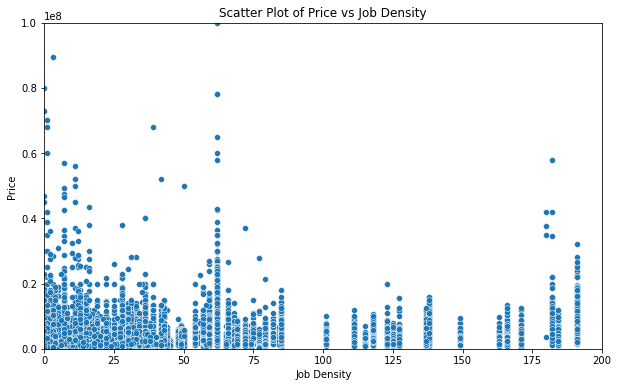

In [270]:
final_df_selected
# Plotter sammenhæng mellem job_density og pris

plt.figure(figsize=(10, 6))
sns.scatterplot(x='job_density', y='priceCash', data=final_df_selected)

# Add titles and labels
plt.title('Scatter Plot of Price vs Job Density')
plt.xlabel('Job Density')
plt.ylabel('Price')
plt.ylim(0,100000000)
plt.xlim(0,200)

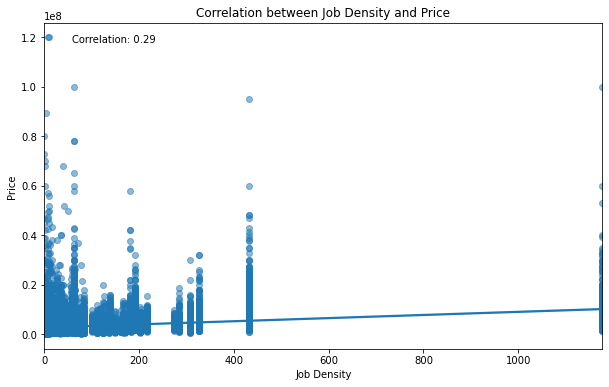

In [271]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming your dataframe is named df
plt.figure(figsize=(10, 6))

# Scatter plot with a regression line
sns.regplot(x='job_density', y='priceCash', data=final_df, scatter_kws={'alpha':0.5})

# Add titles and labels
plt.title('Correlation between Job Density and Price')
plt.xlabel('Job Density')
plt.ylabel('Price')

# Calculate and display the correlation coefficient
correlation = final_df['job_density'].corr(final_df['priceCash'])
plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', ha='left', va='center', transform=plt.gca().transAxes)

plt.show()


(0.0, 200.0)

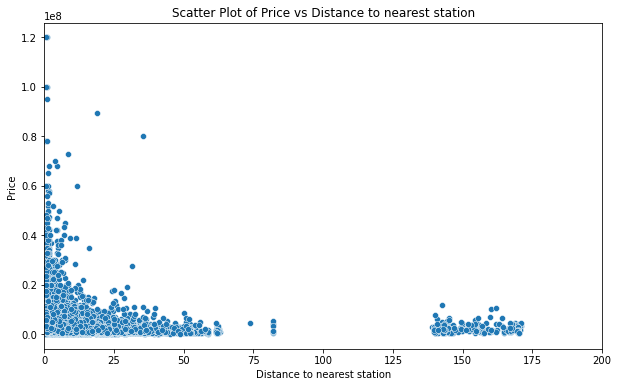

In [272]:
final_df_selected
# Plotter sammenhæng mellem job_density og pris

plt.figure(figsize=(10, 6))
sns.scatterplot(x='distance_to_nearest_station', y='priceCash', data=final_df_selected)

# Add titles and labels
plt.title('Scatter Plot of Price vs Distance to nearest station')
plt.xlabel('Distance to nearest station')
plt.ylabel('Price')
plt.xlim(0,200)
# plt.ylim(0,20000000)

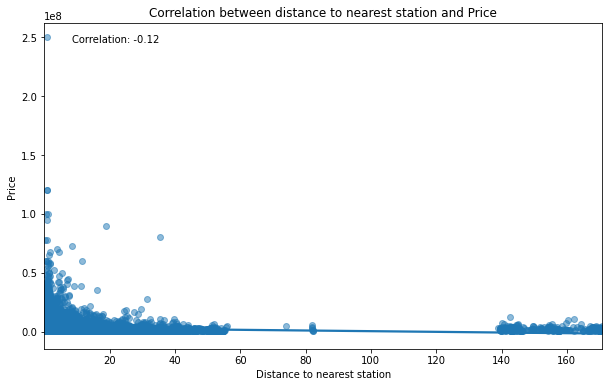

In [177]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming your dataframe is named df
plt.figure(figsize=(10, 6))

# Scatter plot with a regression line
sns.regplot(x='distance_to_nearest_station', y='priceCash', data=final_df, scatter_kws={'alpha':0.5})

# Add titles and labels
plt.title('Correlation between distance to nearest station and Price')
plt.xlabel('Distance to nearest station')
plt.ylabel('Price')

# Calculate and display the correlation coefficient
correlation = final_df['distance_to_nearest_station'].corr(final_df['priceCash'])
plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', ha='left', va='center', transform=plt.gca().transAxes)

plt.show()


Text(0, 0.5, 'Price')

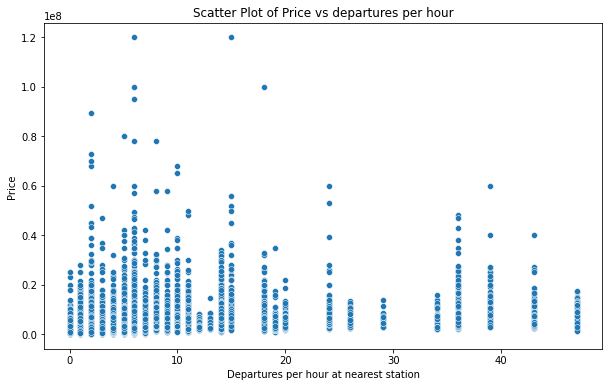

In [274]:
# Plotter sammenhæng mellem job_density og pris

plt.figure(figsize=(10, 6))
sns.scatterplot(x='departures_per_hour', y='priceCash', data=final_df_selected)

# Add titles and labels
plt.title('Scatter Plot of Price vs departures per hour')
plt.xlabel('Departures per hour at nearest station')
plt.ylabel('Price')
# plt.xlim(0,200)


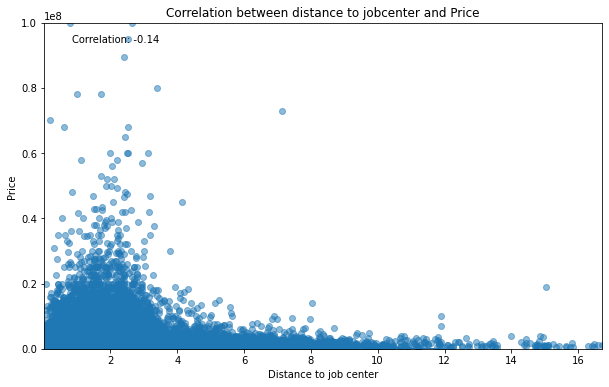

In [280]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming your dataframe is named df
plt.figure(figsize=(10, 6))

# Scatter plot with a regression line
sns.regplot(x='distance_to_job_center', y='priceCash', data=final_df, scatter_kws={'alpha':0.5})

# Add titles and labels
plt.title('Correlation between distance to jobcenter and Price')
plt.xlabel('Distance to job center')
plt.ylabel('Price')

# Calculate and display the correlation coefficient
correlation = final_df['distance_to_job_center'].corr(final_df['priceCash'])
plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', ha='left', va='center', transform=plt.gca().transAxes)
plt.ylim(0,100000000)
plt.show()


(0.0, 20000000.0)

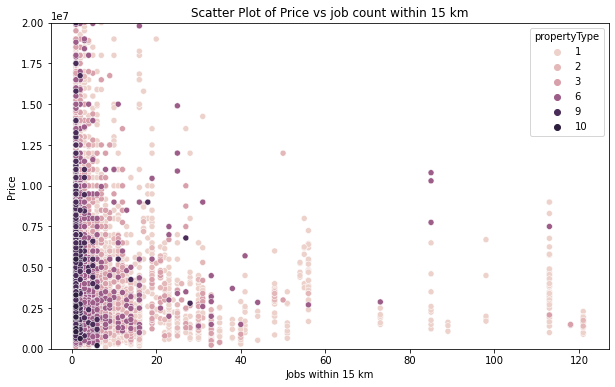

In [281]:
# Plotter sammenhæng mellem job_density og pris

plt.figure(figsize=(10, 6))
sns.scatterplot(x='job_count_15km', y='priceCash', hue = 'propertyType', data=final_df_selected)

# Add titles and labels
plt.title('Scatter Plot of Price vs job count within 15 km')
plt.xlabel('Jobs within 15 km')
plt.ylabel('Price')
# plt.xlim(0,20)
plt.ylim(0,20000000)

In [287]:
final_df[final_df['job_count_15km']==0]
final_df.sort_values('job_count_15km', ascending = True)[0:40]
final_df[final_df['zipCode']==2100][0:40]
final_df.sort_values('distance_to_job_center')

,geometry,job_density,id,street,distance_to_nearest_station,nearest_station_name,departures_per_hour,distance_to_job_center,job_count_15km,latitude,longitude,propertyType,energyClass,priceCash,selfsale,rooms,size,lotSize,floor,buildYear,city,isForeclosure,zipCode,area,daysForSale,net,exp,basementSize,views,projectSaleUrl,additionalBuildings,businessArea,nonPremiumDiscrete,cleanStreet
5858,POINT (11.47111 54.70923000000001),2.0,2040406,Vestervej 17,7.757340,Maribo,2.0,0.016012,1,54.70923,11.47111,1,E,445000,False,4.0,114,729.0,NaN,1901.0,Holeby,False,4960,6,309,2066,585,0,311,None,NaN,0.0,False,Vestervej
13903,POINT (12.26732 54.96014),2.0,2089870,"Rødkildevej 52, Nøbølle",29.385722,Faxe Ladeplads,2.0,0.020942,1,54.96014,12.26732,1,G,1345000,False,4.0,152,841.0,NaN,1913.0,Stege,False,4780,6,134,0,1620,81,208,None,NaN,0.0,False,Rødkildevej
5846,POINT (11.47133 54.70921),2.0,2040199,Vestervej 15,7.755935,Maribo,2.0,0.026432,1,54.70921,11.47133,1,E,695000,False,6.0,287,773.0,NaN,1891.0,Holeby,False,4960,6,310,0,1031,25,300,None,NaN,212.0,False,Vestervej
26086,POINT (12.01953 55.82071999999999),17.0,2125870,"Rønøvej 9, Gerlev",3.157832,Frederikssund,4.0,0.031423,1,55.82072,12.01953,1,A20,3850000,False,5.0,154,841.0,NaN,2020.0,Jægerspris,False,3630,3,34,0,2716,0,52,None,NaN,0.0,False,Rønøvej
40298,POINT (12.0851 55.63946),184.0,2132122,"Hersegade 11B, 2. mf.",0.222980,Roskilde,11.0,0.032293,2,55.63946,12.08510,3,B,2245000,False,2.0,76,NaN,2.0,1968.0,Roskilde,False,4000,5,8,0,2122,0,70,None,NaN,NaN,False,Hersegade
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10081,POINT (10.70611 54.74519),0.0,2074671,"Fakkemosevej 4, Fakkemose",35.532223,Svendborg,1.0,16.399088,1,54.74519,10.70611,1,D,795000,False,4.0,137,541.0,NaN,1934.0,Bagenkop,False,5935,7,178,0,1126,10,131,None,NaN,0.0,False,Fakkemosevej
21608,POINT (10.73279 54.75593000000001),0.0,2113714,"Østervej 11, Østeregnen",34.695922,Svendborg,1.0,16.467512,1,54.75593,10.73279,1,E,1395000,False,8.0,293,1985.0,NaN,1872.0,Bagenkop,False,5935,7,66,0,2719,0,163,None,NaN,0.0,False,Østervej
4835,POINT (11.53064 54.98194),0.0,2027446,Askhavnsvej 61,22.928108,Maribo,2.0,16.488058,1,54.98194,11.53064,1,E,499000,False,4.0,132,3902.0,NaN,1969.0,Femø,False,4945,6,346,0,1496,0,1172,None,NaN,0.0,False,Askhavnsvej
24202,POINT (10.30645 55.75788000000001),0.0,2121295,Kongevejen 106,40.044167,Odense,6.0,16.602338,1,55.75788,10.30645,1,G,1095000,False,5.0,145,3391.0,NaN,1877.0,Endelave,False,8789,10,48,0,1509,0,206,None,NaN,0.0,False,Kongevejen


In [51]:
final_df[final_df['area']!=4].sort_values('distance_to_nearest_station', ascending = False)[320:340]
# Der er noget underlig med hvordan nogle af stationerne kobles på.
# Dem med missing koordinater skal sættes til missing
# Grenå får nærmeste station i kalundborg?
print("Observationer uden station name:" + str(len(final_df[final_df['nearest_station_name'].isna()])))
# Det ligner at der måske er tale om busterminaler?
# Der er nogle problemer ift. at den tager korteste luftafstand over vand
final_df[final_df['nearest_station_name'].isna()]

Observationer uden station name:2951


,geometry,job_density,id,street,distance_to_nearest_station,nearest_station_name,departures_per_hour,distance_to_job_center,job_count_5km,latitude,longitude,propertyType,energyClass,priceCash,selfsale,rooms,size,lotSize,floor,buildYear,city,isForeclosure,zipCode,area,daysForSale,net,exp,basementSize,views,projectSaleUrl,additionalBuildings,businessArea,nonPremiumDiscrete,cleanStreet
15,POINT (8.84496 56.78431),0.0,1009622,"Fruevej 48, Nykøbing Mors",1.608572,None,NaN,1.091707,1,56.78431,8.84496,1,-,895000,False,10.0,140,633.0,NaN,1938.0,Nykøbing M,False,7900,11,3664,0,1308,90,1324,None,NaN,32.0,False,Fruevej
17,POINT (8.78168 56.87391),0.0,1027216,"Bjørnvadbro 5, Tøving",10.140037,None,NaN,6.008449,1,56.87391,8.78168,1,F,645000,False,5.0,132,6575.0,NaN,1926.0,Nykøbing M,False,7900,11,3607,0,1039,8,1275,None,NaN,0.0,False,Bjørnvadbro
22,POINT (10.25088 55.12371),0.0,1137900,Odensevej 163,3.349379,None,NaN,1.878131,1,55.12371,10.25088,1,G,795000,False,7.0,188,903.0,NaN,1900.0,Faaborg,False,5600,7,3256,3604,1127,14,3545,None,NaN,0.0,False,Odensevej
41,POINT (8.881589999999999 56.74959),0.0,1318055,"Hasselvej 20, Glyngøre",5.137154,None,NaN,1.386837,2,56.74959,8.88159,1,C,995000,False,4.0,152,1208.0,NaN,1980.0,Roslev,False,7870,9,2675,0,1567,114,1135,None,NaN,0.0,False,Hasselvej
46,POINT (9.20964 57.06004),0.0,1336771,"Gøttrupvej 246, Gøttrup",36.305356,None,NaN,4.020090,1,57.06004,9.20964,1,C,560000,False,5.0,136,1183.0,NaN,1964.0,Fjerritslev,False,9690,11,2621,0,941,32,368,None,NaN,0.0,False,Gøttrupvej
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46739,POINT (10.25779 54.93693),0.0,2129230,Abildvej 5,17.478244,None,NaN,2.509032,1,54.93693,10.25779,7,-,150000,False,0.0,0,970.0,NaN,NaN,Søby Ærø,False,5985,7,20,733,127,0,86,None,NaN,NaN,False,Abildvej
46750,POINT (10.26066 55.22116),0.0,2129799,"Søndervej 73, Brobyværk",14.213601,None,NaN,1.126653,1,55.22116,10.26066,7,-,895000,False,4.0,0,10899.0,NaN,NaN,Broby,False,5672,7,16,0,724,0,15,None,NaN,12.0,False,Søndervej
46772,POINT (11.6652 55.88108),0.0,2131563,Æble Alle 5,4.533547,None,NaN,3.234284,1,55.88108,11.66520,7,-,375000,False,0.0,0,755.0,NaN,NaN,Nykøbing Sj,False,4500,6,9,1912,308,0,57,None,NaN,NaN,False,Æble Alle
46814,POINT (10.80138 54.92939000000001),0.0,2133129,Pederstrupvej 4A,5.163285,None,NaN,4.240310,1,54.92939,10.80138,7,-,79500,False,0.0,0,1225.0,NaN,NaN,Rudkøbing,False,5900,7,5,422,40,0,111,None,NaN,NaN,False,Pederstrupvej


### Deskriptiv statistik på Boliga variable

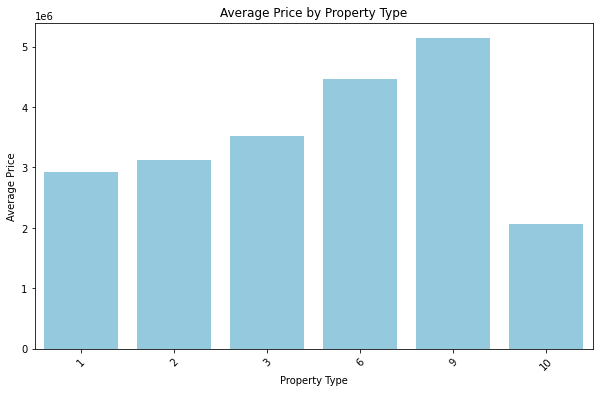

In [353]:
# Assuming your dataframe is named boliga_df
# Group by propertyType and calculate the mean price
average_price = bolig_df.groupby('propertyType')['price'].mean().reset_index()

# Plotting the barplot using seaborn with the same color for all bars
plt.figure(figsize=(10, 6))
sns.barplot(x='propertyType', y='price', data=average_price, color='skyblue')
plt.xlabel('Property Type')
plt.ylabel('Average Price')
plt.title('Average Price by Property Type')
plt.xticks(rotation=45)
plt.show()

In [358]:
# Plotter antal ejendomme i hver boligtype
# Danner først variabel med boligtypenavn
# Create a dictionary to map the propertyType values to their corresponding categories
property_type_mapping = {
    1: 'Villa',
    2: 'Chainhouse',
    3: 'Apartment',
    6: 'Country estate',
    9: 'Villa apartment',
    10: 'Other'
}

# Create the new column by mapping the propertyType column using the dictionary
final_df['new_propertyType'] = final_df['propertyType'].map(property_type_mapping)

count_property = final_df['new_propertyType'].value_counts()
count_property

Villa              30590
Apartment           6984
Chainhouse          3147
Country estate      2327
Villa apartment      275
Other                  8
Name: new_propertyType, dtype: int64

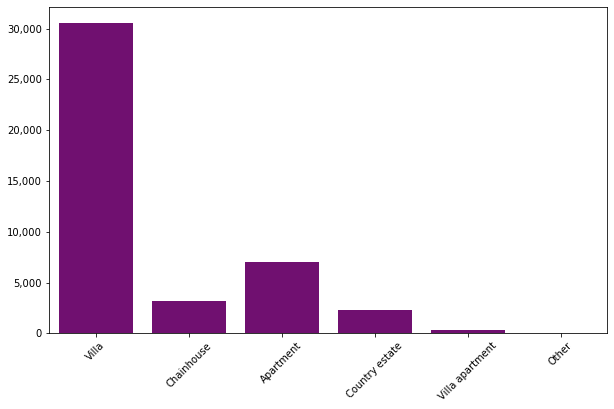

In [351]:
import matplotlib.ticker as mtick
# Create a count plot (bar plot of occurrences)
plt.figure(figsize=(10, 6))
sns.countplot(x='new_propertyType', data=final_df, color = 'purple')

# Add titles and labels
# plt.title('Occurrences of Each Property Type')

# Rotate x labels if they overlap
plt.xticks(rotation=45)

# Apply thousand separators to the y-axis
plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, p: format(int(x), ',')))

# Remove axis titles
plt.xlabel('')
plt.ylabel('')

plt.show()


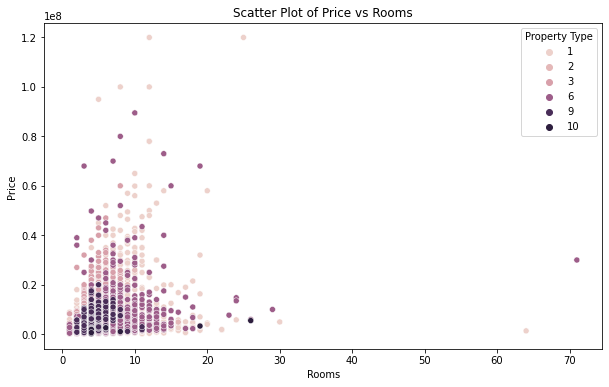

In [140]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your dataframe is named bolig_df
plt.figure(figsize=(10, 6))
sns.scatterplot(x='rooms', y='price', hue='propertyType', data=bolig_df)

# Add titles and labels
plt.title('Scatter Plot of Price vs Rooms')
plt.xlabel('Rooms')
plt.ylabel('Price')

# Optionally, add a legend to explain the colors
plt.legend(title='Property Type')

(0.0, 100000000.0)

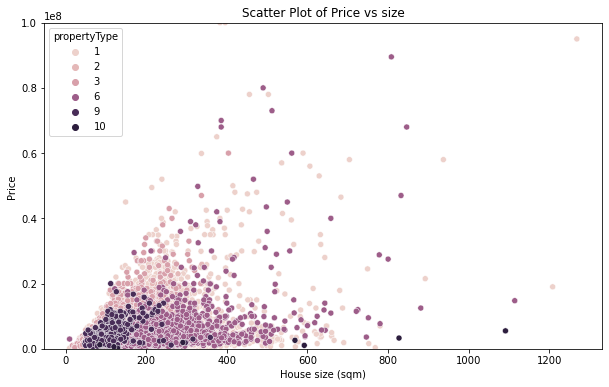

In [141]:
# Plotter sammenhæng mellem job_density og pris

plt.figure(figsize=(10, 6))
sns.scatterplot(x='size', y='price', hue = "propertyType", data=bolig_df)

# Add titles and labels
plt.title('Scatter Plot of Price vs size')
plt.xlabel('House size (sqm)')
plt.ylabel('Price')
# plt.xlim(0,20)
plt.ylim(0,100000000)

(1.0, 1000000.0)

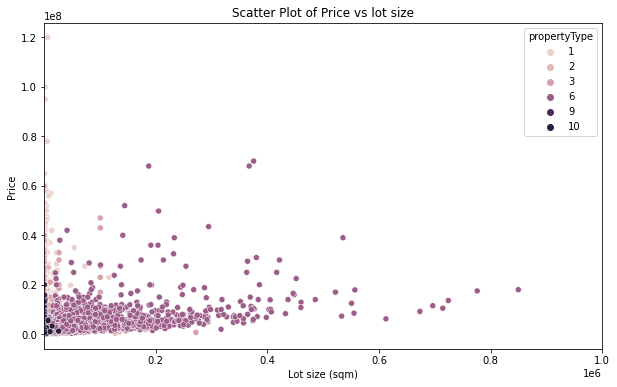

In [142]:
# Plotter sammenhæng mellem job_density og pris

plt.figure(figsize=(10, 6))
sns.scatterplot(x='lotSize', y='price', hue = "propertyType", data=bolig_df)

# Add titles and labels
plt.title('Scatter Plot of Price vs lot size')
plt.xlabel('Lot size (sqm)')
plt.ylabel('Price')
plt.xlim(1,1000000)
# plt.ylim(0,100000000)

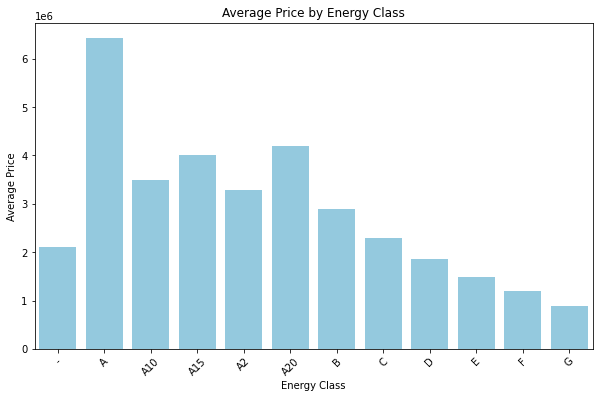

In [143]:
# Assuming your dataframe is named boliga_df
# Group by propertyType and calculate the mean price
average_price = bolig_df.groupby('energyClass')['price'].median().reset_index()

# Plotting the barplot using seaborn with the same color for all bars
plt.figure(figsize=(10, 6))
sns.barplot(x='energyClass', y='price', data=average_price, color='skyblue')
plt.xlabel('Energy Class')
plt.ylabel('Average Price')
plt.title('Average Price by Energy Class')
plt.xticks(rotation=45)
plt.show()

Text(0, 0.5, 'Price')

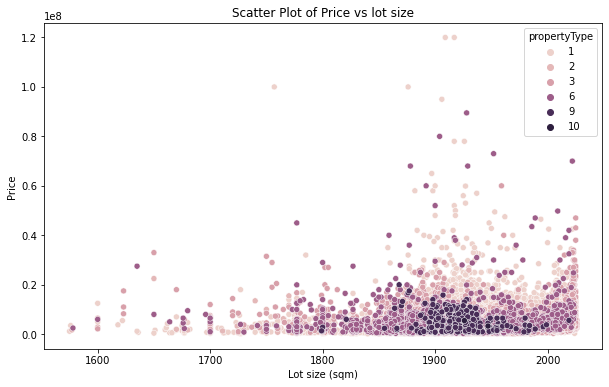

In [144]:
# Plotter sammenhæng mellem job_density og pris

plt.figure(figsize=(10, 6))
sns.scatterplot(x='buildYear', y='price', hue = 'propertyType', data=bolig_df)

# Add titles and labels
plt.title('Scatter Plot of Price vs lot size')
plt.xlabel('Lot size (sqm)')
plt.ylabel('Price')
# plt.xlim(1,1000000)
# plt.ylim(0,100000000)


Text(0, 0.5, 'Price')

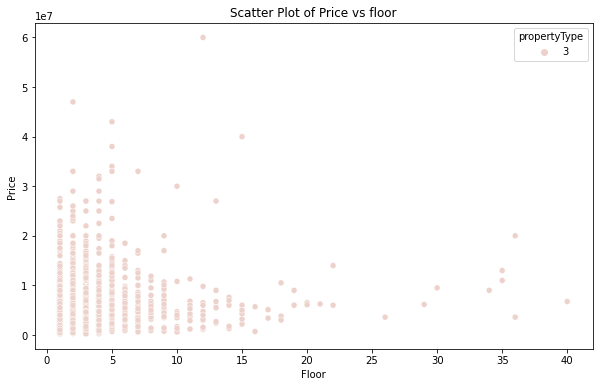

In [145]:
# Plotter sammenhæng mellem job_density og pris
test = bolig_df[bolig_df['propertyType']==3]
plt.figure(figsize=(10, 6))
sns.scatterplot(x='floor', y='price', hue = 'propertyType', data=test)

# Add titles and labels
plt.title('Scatter Plot of Price vs floor')
plt.xlabel('Floor')
plt.ylabel('Price')
# plt.xlim(1,1000000)
# plt.ylim(0,100000000)


(0.0, 100000000.0)

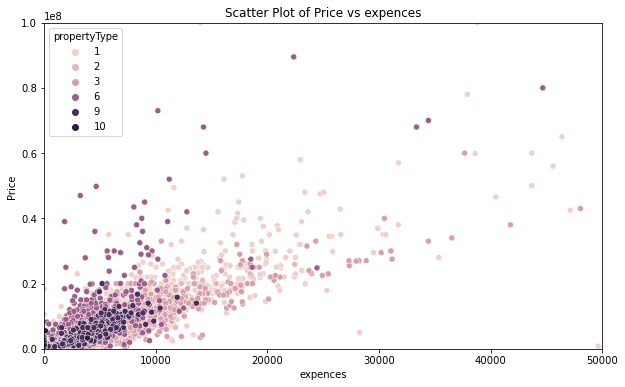

In [146]:
# Plotter sammenhæng mellem job_density og pris

plt.figure(figsize=(10, 6))
sns.scatterplot(x='exp', y='price', hue = 'propertyType', data=bolig_df)

# Add titles and labels
plt.title('Scatter Plot of Price vs expences')
plt.xlabel('expences')
plt.ylabel('Price')
plt.xlim(0,50000)
plt.ylim(0,100000000)


In [132]:
bolig_df

,id,latitude,longitude,propertyType,energyClass,price,rooms,size,lotSize,floor,buildYear,city,isForeclosure,municipality,zipCode,street,squaremeterPrice,area,exp,basementSize,businessArea,cleanStreet,createdDate
0,493064,55.05967,9.73815,1,-,395000,6.0,128,1027.0,NaN,1954.0,Nordborg,False,540.0,6430,Kirkegade 23,3085.0,8,836,57,0.0,Kirkegade,2010-05-29T02:59:44.083Z
1,605725,57.34863,10.01814,1,F,525000,4.0,132,834.0,NaN,1925.0,Vrå,False,860.0,9760,"Hovedgaden 36, Poulstrup",3977.0,11,943,4,NaN,Hovedgaden,2011-04-19T22:01:48.687Z
2,626139,56.56825,8.16081,1,E,1295000,10.0,253,2442.0,NaN,1904.0,Lemvig,False,665.0,7620,"Harboørevej 1, Strande",5118.0,9,1542,9,0.0,Harboørevej,2011-05-25T02:57:51.530Z
3,640814,56.88116,8.62765,1,C,1995000,8.0,197,1260.0,NaN,1972.0,Thisted,False,787.0,7700,"Skyumvej 7, Vilsund",10126.0,11,1497,49,0.0,Skyumvej,2011-06-21T02:57:32.303Z
4,677591,56.51651,8.53851,1,D,945000,3.0,155,784.0,NaN,1968.0,Struer,False,671.0,7600,"Havremarken 4, Resen",6096.0,9,1080,0,0.0,Havremarken,2011-09-06T02:37:13.967Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47137,2125579,55.79757,10.59841,10,-,201600,4.0,129,3545.0,NaN,NaN,Samsø,True,741.0,8305,Ørby Hovedgade 1,1562.0,10,0,0,NaN,Ørby Hovedgade,2024-07-12T11:08:09.327Z
47138,2122965,56.47018,9.39722,10,-,2600000,6.0,569,3913.0,NaN,NaN,Viborg,True,791.0,8800,Tagtækkervej 10,4569.0,9,0,0,0.0,Tagtækkervej,2024-07-04T09:07:06.273Z
47139,2131176,55.25401,9.48690,10,-,1950000,4.0,291,218.0,NaN,NaN,Haderslev,True,510.0,6100,Laurids Skaus Gade 5,6701.0,8,0,0,0.0,Laurids Skaus Gade,2024-08-05T13:07:11.000Z
47140,2131489,55.29455,10.21436,10,-,630000,4.0,120,1133.0,NaN,NaN,Tommerup,True,420.0,5690,Knarreborgvej 8,5250.0,7,0,0,0.0,Knarreborgvej,2024-08-06T09:07:14.203Z
